In [ ]:
pip install ucimlrepo

In [ ]:
!pip install ucimlrepo
from ucimlrepo import fetch_ucirepo

# fetch dataset
covertype = fetch_ucirepo(id=31)

# data (as pandas dataframes)
X = covertype.data.features
y = covertype.data.targets

# metadata
print(covertype.metadata)

# variable information
print(covertype.variables)


{'uci_id': 31, 'name': 'Covertype', 'repository_url': 'https://archive.ics.uci.edu/dataset/31/covertype', 'data_url': 'https://archive.ics.uci.edu/static/public/31/data.csv', 'abstract': 'Classification of pixels into 7 forest cover types based on attributes such as elevation, aspect, slope, hillshade, soil-type, and more.', 'area': 'Biology', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 581012, 'num_features': 54, 'feature_types': ['Categorical', 'Integer'], 'demographics': [], 'target_col': ['Cover_Type'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1998, 'last_updated': 'Sat Mar 16 2024', 'dataset_doi': '10.24432/C50K5N', 'creators': ['Jock Blackard'], 'intro_paper': None, 'additional_info': {'summary': 'Predicting forest cover type from cartographic variables only (no remotely sensed data).  The actual forest cover type for a given observation (30 x 30 meter cell) was determined from

In [ ]:
import requests

# URL of the CSV file
url = 'https://archive.ics.uci.edu/static/public/31/data.csv'

# Send a GET request to the URL
response = requests.get(url)

# Check if the request was successful
if response.status_code == 200:
    # Save the content to a local file
    with open('data.csv', 'wb') as file:
        file.write(response.content)
    print('File downloaded and saved as data.csv')
else:
    print('Failed to download the file. Status code:', response.status_code)

File downloaded and saved as data.csv


In [ ]:
import pandas as pd
import numpy as np

# Load the dataset
file_path = '/covtype.data'
data = pd.read_c'sv(file_path, header=None)
# Display initial information about the dataset
print("Initial dataset shape:", data.shape)
print("\nInitial null values:")
print(data.isnull().sum())

# Remove rows with null values
data_clean = data.dropna()

# Display information after removing null values
print("\nDataset shape after removing null values:", data_clean.shape)
print("\nRemaining null values:")
print(data_clean.isnull().sum())

# Display the first few rows of the cleaned dataset
print("\nFirst few rows of the cleaned dataset:")
print(data_clean.head())

print("\nColumn names:")
print(data_clean.columns)

# Assuming the last column is the target variable
target_column = data_clean.columns[-1]

print(f"\nUsing column {target_column} as the target variable")

# The cleaned dataset 'data_clean' can now be used in your main analysis

Initial dataset shape: (105343, 55)

Initial null values:
0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    0
19    0
20    0
21    0
22    0
23    0
24    0
25    0
26    0
27    0
28    0
29    0
30    0
31    0
32    0
33    0
34    0
35    0
36    0
37    0
38    0
39    0
40    0
41    0
42    0
43    1
44    1
45    1
46    1
47    1
48    1
49    1
50    1
51    1
52    1
53    1
54    1
dtype: int64

Dataset shape after removing null values: (105342, 55)

Remaining null values:
0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
18    0
19    0
20    0
21    0
22    0
23    0
24    0
25    0
26    0
27    0
28    0
29    0
30    0
31    0
32    0
33    0
34    0
35    0
36    0
37    0
38    0
39    0
40    0
41    0
42    0
43    0
44    0
45    0
46    0
47    0
48    0
49    0
50    0
5

First few rows of the dataset:
   Elevation  Aspect  Slope  Horizontal_Distance_To_Hydrology  \
0       2596      51      3                               258   
1       2590      56      2                               212   
2       2804     139      9                               268   
3       2785     155     18                               242   
4       2595      45      2                               153   

   Vertical_Distance_To_Hydrology  Horizontal_Distance_To_Roadways  \
0                               0                              510   
1                              -6                              390   
2                              65                             3180   
3                             118                             3090   
4                              -1                              391   

   Hillshade_9am  Hillshade_Noon  Hillshade_3pm  \
0            221             232            148   
1            220             235            151   
2   

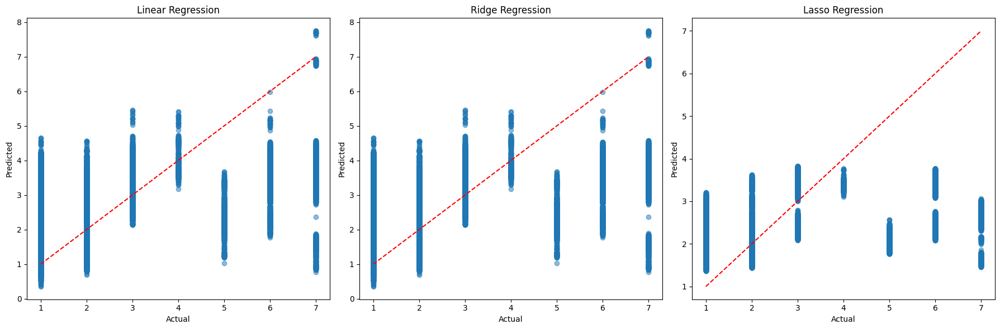

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/data_1.csv'
data = pd.read_csv(file_path)

# Display the first few rows and columns of the dataset to understand its structure
print("First few rows of the dataset:")
print(data.head())

print("\nColumn names:")
print(data.columns)

# Assuming 'Cover_Type' is the last column, adjust this based on your dataset
target_column = 'Cover_Type'  # Adjust if necessary

# Check if the target column exists, and adjust if necessary
if target_column not in data.columns:
    raise ValueError(f"Target column '{target_column}' not found. Please check the column names.")

# Separate features and target
X = data.drop(target_column, axis=1)
y = data[target_column]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize and train the Linear Regression model
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)

# Make predictions
y_pred_linear = linear_regressor.predict(X_test)

# Initialize and train Ridge Regression model
ridge_regressor = Ridge(alpha=1.0)
ridge_regressor.fit(X_train, y_train)
y_pred_ridge = ridge_regressor.predict(X_test)

# Initialize and train Lasso Regression model
lasso_regressor = Lasso(alpha=0.1)
lasso_regressor.fit(X_train, y_train)
y_pred_lasso = lasso_regressor.predict(X_test)

# Calculate evaluation metrics
def calculate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

# Calculate metrics for each model
metrics_linear = calculate_metrics(y_test, y_pred_linear)
metrics_ridge = calculate_metrics(y_test, y_pred_ridge)
metrics_lasso = calculate_metrics(y_test, y_pred_lasso)

print("Linear Regression Metrics:", metrics_linear)
print("Ridge Regression Metrics:", metrics_ridge)
print("Lasso Regression Metrics:", metrics_lasso)

# Plot the actual vs predicted values for each model
plt.figure(figsize=(18, 6))

# Plot Linear Regression
plt.subplot(1, 3, 1)
plt.scatter(y_test, y_pred_linear, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Linear Regression')

# Plot Ridge Regression
plt.subplot(1, 3, 2)
plt.scatter(y_test, y_pred_ridge, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Ridge Regression')

# Plot Lasso Regression
plt.subplot(1, 3, 3)
plt.scatter(y_test, y_pred_lasso, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Lasso Regression')

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

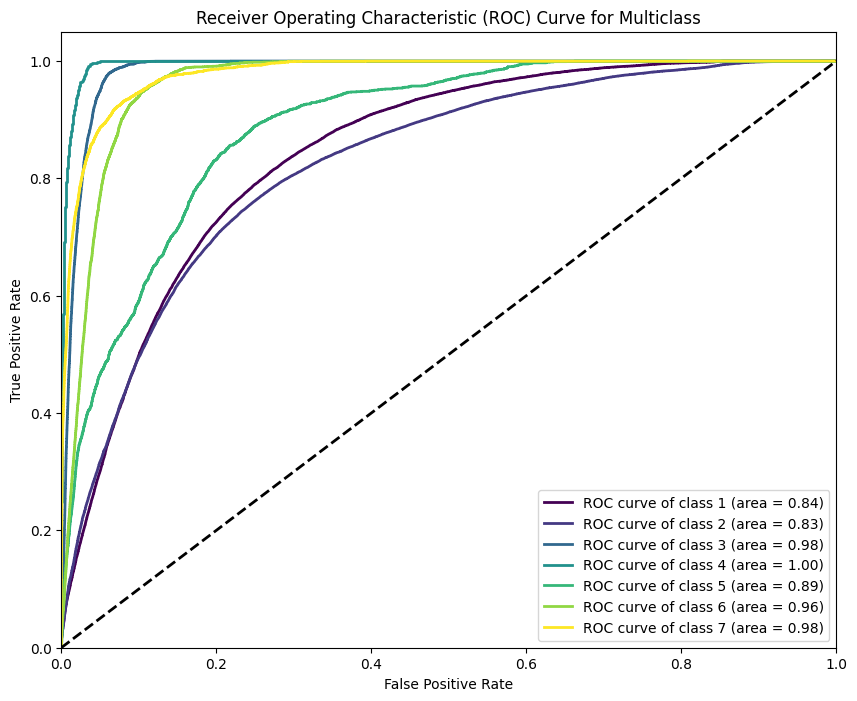

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
from sklearn.multiclass import OneVsRestClassifier

# Load the dataset
file_path = '/content/data_1.csv'
data = pd.read_csv(file_path)

# Separate features and target
X = data.drop('Cover_Type', axis=1)
y = data['Cover_Type']

# Binarize the output
classes = np.unique(y)
y_bin = label_binarize(y, classes=classes)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_bin, test_size=0.2, random_state=42)

# Initialize and train the One-vs-Rest Logistic Regression model
logistic_regressor = OneVsRestClassifier(LogisticRegression())
logistic_regressor.fit(X_train, y_train)

# Make predictions
y_score = logistic_regressor.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
colors = plt.cm.viridis(np.linspace(0, 1, len(classes)))
for i, color in zip(range(len(classes)), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'ROC curve of class {classes[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc="lower right")
plt.show()


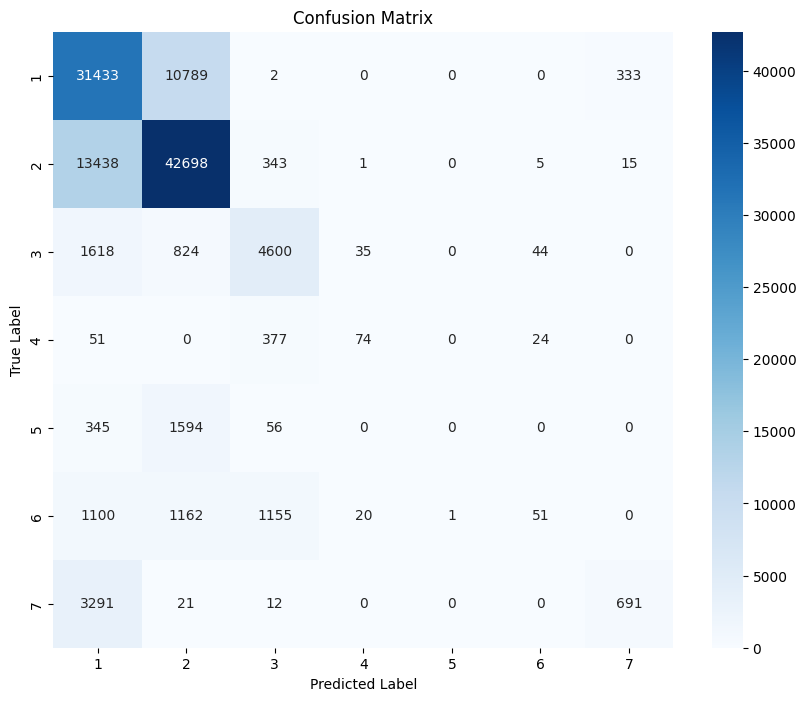

Classification Report:

              precision    recall  f1-score   support

     Class 1       0.61      0.74      0.67     42557
     Class 2       0.75      0.76      0.75     56500
     Class 3       0.70      0.65      0.67      7121
     Class 4       0.57      0.14      0.23       526
     Class 5       0.00      0.00      0.00      1995
     Class 6       0.41      0.01      0.03      3489
     Class 7       0.67      0.17      0.27      4015

    accuracy                           0.68    116203
   macro avg       0.53      0.35      0.37    116203
weighted avg       0.67      0.68      0.66    116203

Overall Accuracy: 0.68


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

# Predict the class labels
y_pred = logistic_regressor.predict(X_test)

y_test_labels = np.argmax(y_test, axis=1)
y_pred_labels = np.argmax(y_pred, axis=1)

# Create a confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_labels)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Print classification report
print("Classification Report:\n")
print(classification_report(y_test_labels, y_pred_labels, target_names=[f'Class {i}' for i in classes]))

# Print overall accuracy
accuracy = accuracy_score(y_test_labels, y_pred_labels)
print(f'Overall Accuracy: {accuracy:.2f}')

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Cross-Validation Accuracy Scores: [0.72304502 0.67524074 0.431206   0.59441318 0.46170462]
Average Cross-Validation Accuracy: 0.58


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

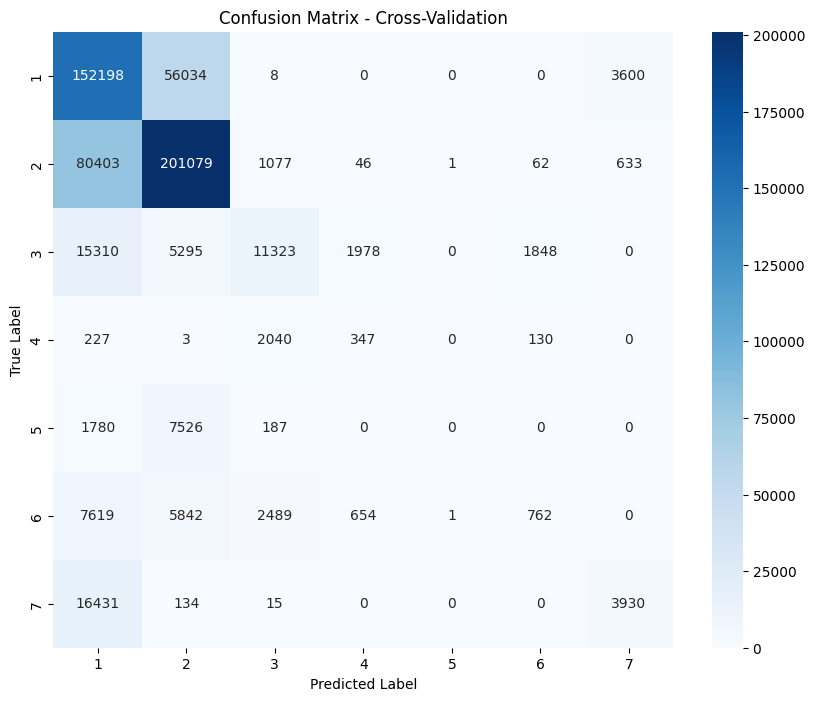

Classification Report - Cross-Validation:

              precision    recall  f1-score   support

     Class 1       0.56      0.72      0.63    211840
     Class 2       0.73      0.71      0.72    283301
     Class 3       0.66      0.32      0.43     35754
     Class 4       0.11      0.13      0.12      2747
     Class 5       0.00      0.00      0.00      9493
     Class 6       0.27      0.04      0.08     17367
     Class 7       0.48      0.19      0.27     20510

    accuracy                           0.64    581012
   macro avg       0.40      0.30      0.32    581012
weighted avg       0.62      0.64      0.62    581012

Overall Cross-Validated Accuracy: 0.64


In [ ]:
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import make_scorer, accuracy_score, classification_report, confusion_matrix

# Define the One-vs-Rest Logistic Regression model
logistic_regressor = OneVsRestClassifier(LogisticRegression())

# Perform cross-validation
cv_scores = cross_val_score(logistic_regressor, X_scaled, y_bin, cv=5, scoring='accuracy')

# Print the cross-validation scores
print(f'Cross-Validation Accuracy Scores: {cv_scores}')
print(f'Average Cross-Validation Accuracy: {np.mean(cv_scores):.2f}')

# Use cross_val_predict to get predictions from each fold
y_pred_cv = cross_val_predict(logistic_regressor, X_scaled, y_bin, cv=5)

# Convert predictions back from one-hot encoding to original labels
y_true_labels = np.argmax(y_bin, axis=1)
y_pred_labels_cv = np.argmax(y_pred_cv, axis=1)

# Confusion Matrix for Cross-Validation
cm_cv = confusion_matrix(y_true_labels, y_pred_labels_cv)

# Plot the confusion matrix for cross-validation
plt.figure(figsize=(10, 8))
sns.heatmap(cm_cv, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix - Cross-Validation')
plt.show()

# Print classification report for cross-validation
print("Classification Report - Cross-Validation:\n")
print(classification_report(y_true_labels, y_pred_labels_cv, target_names=[f'Class {i}' for i in classes]))

# Print overall cross-validated accuracy
cv_accuracy = accuracy_score(y_true_labels, y_pred_labels_cv)
print(f'Overall Cross-Validated Accuracy: {cv_accuracy:.2f}')


In [ ]:
from sklearn.dummy import DummyClassifier
from scipy.stats import ttest_rel
import numpy as np

# Create and fit a dummy classifier
dummy_clf = DummyClassifier(strategy='most_frequent')
dummy_clf.fit(X_train, y_train)
dummy_pred = dummy_clf.predict(X_test)
dummy_pred_labels = np.argmax(dummy_pred, axis=1)

# Logistic regression predictions
y_pred_labels = np.argmax(y_pred_proba, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

# Calculate accuracy for each sample
logistic_correct = (y_pred_labels == y_test_labels).astype(int)
dummy_correct = (dummy_pred_labels == y_test_labels).astype(int)

# Perform paired t-test
t_statistic, p_value = ttest_rel(logistic_correct, dummy_correct)

# Display results
print(f'T-test statistic: {t_statistic:.4f}')
print(f'P-value: {p_value:.4f}')

if p_value < 0.05:
    print("The difference in performance is statistically significant.")
else:
    print("The difference in performance is not statistically significant.")


T-test statistic: 176.9333
P-value: 0.0000
The difference in performance is statistically significant.


In [ ]:
from sklearn.metrics import confusion_matrix
from statsmodels.stats.contingency_tables import mcnemar

# Generate predictions for a specific class (e.g., class 1)
class_index = 0  # Change this index for other classes
y_pred = logistic_regressor.predict(X_test)
y_true_class = y_test[:, class_index]
y_pred_class = y_pred[:, class_index]

# Convert predictions to binary (0 or 1) for the specific class
y_true_class_binary = (y_true_class > 0).astype(int)
y_pred_class_binary = (y_pred_class > 0).astype(int)

# Create a confusion matrix
conf_matrix = confusion_matrix(y_true_class_binary, y_pred_class_binary)
print("Confusion Matrix:\n", conf_matrix)

# Apply McNemar's Test
result = mcnemar(conf_matrix, exact=False)
print(f"McNemar's test statistic: {result.statistic}, p-value: {result.pvalue}")

# Interpretation
if result.pvalue < 0.05:
    print("Significant difference between the predictions and actuals.")
else:
    print("No significant difference between the predictions and actuals.")


Confusion Matrix:
 [[61573 12073]
 [14455 28102]]
McNemar's test statistic: 213.70480247285886, p-value: 2.1360711336730425e-48
Significant difference between the predictions and actuals.


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

# Load the dataset from a CSV file
data = pd.read_csv('/content/data_1.csv')

# Assuming the last column is the target variable and the rest are features
X = data.iloc[:, :-1].values  # Features
y = data.iloc[:, -1].values   # Target

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid for RandomizedSearchCV
param_distributions = {
    'C': np.logspace(-3, 3, 7),
    'gamma': ['scale', 'auto'] + list(np.logspace(-3, 3, 5)),
    'kernel': ['rbf']
}

# Create SVM classifier
svm = SVC(random_state=42)

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(svm, param_distributions, n_iter=10, cv=3, n_jobs=-1, verbose=2, random_state=42)
random_search.fit(X_train_scaled, y_train)

# Get the best parameters and model
best_params = random_search.best_params_
best_svm = random_search.best_estimator_

print("Best parameters:", best_params)

# Make predictions on the test set
y_pred = best_svm.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Print detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Function to predict cover type for new data
def predict_cover_type(new_data):
    new_data_scaled = scaler.transform(new_data)
    prediction = best_svm.predict(new_data_scaled)
    return prediction[0]

# Example usage
new_sample = np.array([[2596, 51, 3, 258, 0, 510, 221, 232, 148, 6279, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])
predicted_cover_type = predict_cover_type(new_sample)
print(f"\nPredicted Cover Type for new sample: {predicted_cover_type}")

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.impute import SimpleImputer

# Function to load data from CSV file
def load_data(file_path):
    data = pd.read_csv(file_path)
    X = data.drop('Cover_Type', axis=1)  # Assuming 'Cover_Type' is the target column
    y = data['Cover_Type']

    # Drop rows where target 'y' is NaN
    non_nan_indices = y.notna()
    X = X[non_nan_indices]
    y = y[non_nan_indices]

    return X, y

# Load the data
file_path = '/content/data_1.csv'  # Replace with your actual file path
X, y = load_data(file_path)

# Impute missing values in features with the mean
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the KNN classifier
k = 5  # You can adjust this value
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X_train_scaled, y_train)

# Make predictions
y_pred = knn.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Print detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Function to predict cover type for new data
def predict_cover_type(new_data):
    new_data_scaled = scaler.transform(new_data)
    prediction = knn.predict(new_data_scaled)
    return prediction[0]

# Example usage
new_sample = np.array([[2596, 51, 3, 258, 0, 510, 221, 232, 148, 6279, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])
predicted_cover_type = predict_cover_type(new_sample)
print(f"\nPredicted Cover Type for new sample: {predicted_cover_type}")


Accuracy: 0.9280

Classification Report:
              precision    recall  f1-score   support

           1       0.94      0.92      0.93     42557
           2       0.93      0.95      0.94     56500
           3       0.90      0.92      0.91      7121
           4       0.85      0.73      0.78       526
           5       0.84      0.76      0.80      1995
           6       0.83      0.80      0.82      3489
           7       0.94      0.94      0.94      4015

    accuracy                           0.93    116203
   macro avg       0.89      0.86      0.87    116203
weighted avg       0.93      0.93      0.93    116203


Predicted Cover Type for new sample: 5


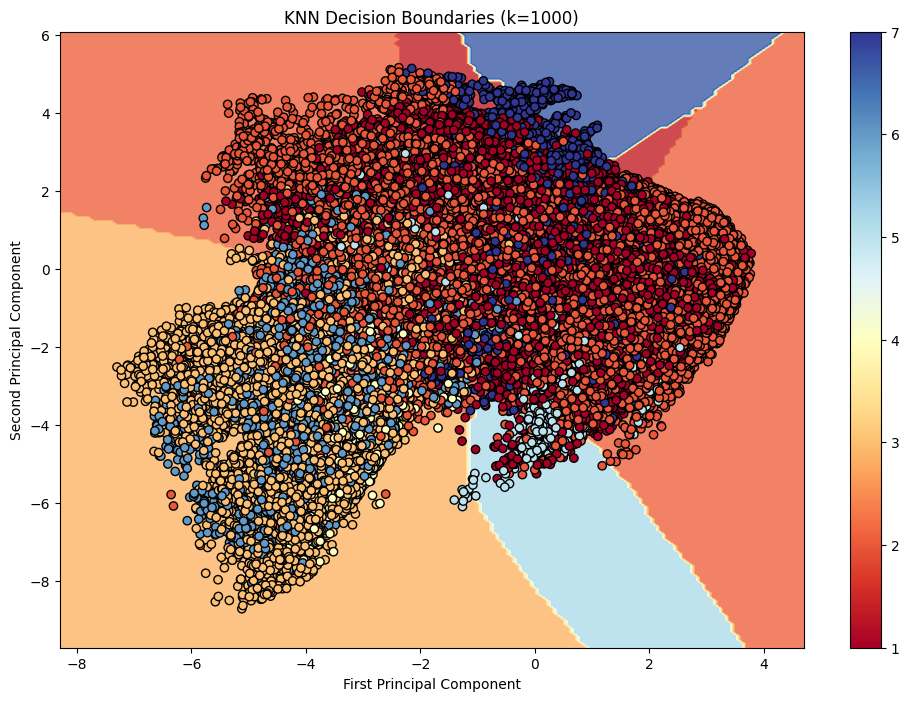

Explained variance ratio: [0.06854872 0.05408859]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reduce to 2D using PCA for visualization
pca = PCA(n_components=2)
X_train_2d = pca.fit_transform(X_train_scaled)
X_test_2d = pca.transform(X_test_scaled)

# Train KNN
k = 1000
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X_train_2d, y_train)

# Create a mesh grid
x_min, x_max = X_train_2d[:, 0].min() - 1, X_train_2d[:, 0].max() + 1
y_min, y_max = X_train_2d[:, 1].min() - 1, X_train_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))

# Predict for each point in the mesh
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.figure(figsize=(12, 8))
plt.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.RdYlBu)

# Plot the training points
scatter = plt.scatter(X_train_2d[:, 0], X_train_2d[:, 1], c=y_train, cmap=plt.cm.RdYlBu, edgecolor='black')

plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('KNN Decision Boundaries (k={})'.format(k))

# Add a color bar
plt.colorbar(scatter)

# Show the plot
plt.show()

# Print the explained variance ratio
print("Explained variance ratio:", pca.explained_variance_ratio_)

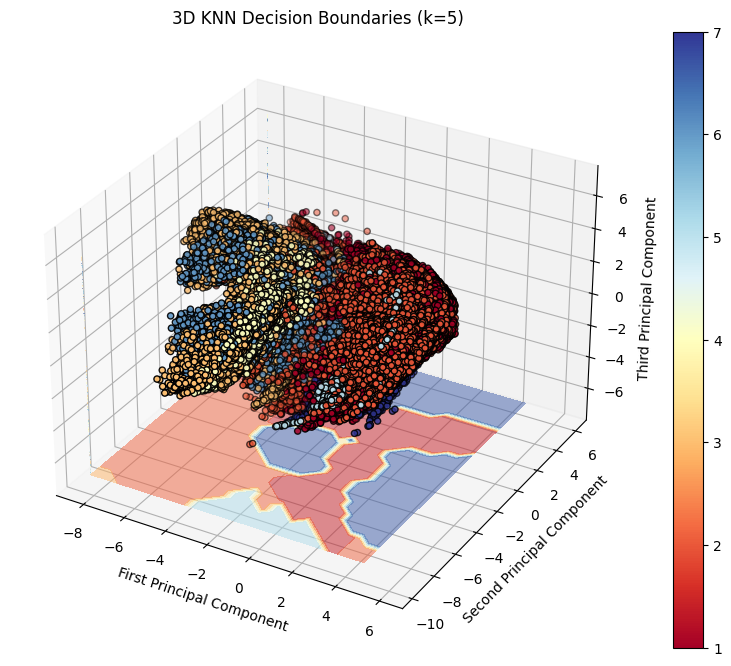

Explained variance ratio: [0.06854872 0.05408859 0.04442057]
Total explained variance: 0.16705788210552155


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA

# Assume X and y are defined
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reduce to 3D using PCA for visualization3
pca = PCA(n_components=3)
X_train_3d = pca.fit_transform(X_train_scaled)
X_test_3d = pca.transform(X_test_scaled)

# Train KNN
k = 5  # Reduced from 1000 for computational efficiency
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X_train_3d, y_train)

# Create a mesh grid
x_min, x_max = X_train_3d[:, 0].min() - 1, X_train_3d[:, 0].max() + 1
y_min, y_max = X_train_3d[:, 1].min() - 1, X_train_3d[:, 1].max() + 1
z_min, z_max = X_train_3d[:, 2].min() - 1, X_train_3d[:, 2].max() + 1
xx, yy, zz = np.meshgrid(np.arange(x_min, x_max, 0.5),
                         np.arange(y_min, y_max, 0.5),
                         np.arange(z_min, z_max, 0.5))

# Predict for each point in the mesh
grid = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
Z = knn.predict(grid)
Z = Z.reshape(xx.shape)

# Plot the decision boundary
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the training points
scatter = ax.scatter(X_train_3d[:, 0], X_train_3d[:, 1], X_train_3d[:, 2],
                     c=y_train, cmap=plt.cm.RdYlBu, edgecolor='black')

# Plot the decision boundary
ax.contourf(xx[:,:,0], yy[:,:,0], Z[:,:,0],
            zdir='z', offset=z_min, cmap=plt.cm.RdYlBu, alpha=0.5)
ax.contourf(xx[:,0,:], Z[:,0,:], zz[:,0,:],
            zdir='y', offset=y_max, cmap=plt.cm.RdYlBu, alpha=0.5)
ax.contourf(Z[0,:,:], yy[0,:,:], zz[0,:,:],
            zdir='x', offset=x_min, cmap=plt.cm.RdYlBu, alpha=0.5)

ax.set_xlabel('First Principal Component')
ax.set_ylabel('Second Principal Component')
ax.set_zlabel('Third Principal Component')
ax.set_title('3D KNN Decision Boundaries (k={})'.format(k))

# Add a color bar
plt.colorbar(scatter)

# Show the plot
plt.show()

# Print the explained variance ratio
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Total explained variance:", sum(pca.explained_variance_ratio_))

In [ ]:
import pandas as pd
import numpy as np
from random import seed, randrange
from math import exp, floor

# Function definitions...

# Function to calculate sigmoid with overflow handling
def sigmoid(z):
    if z >= 0:
        return 1.0 / (1.0 + exp(-z))  # Normal sigmoid calculation
    else:
        exp_z = exp(z)
        return exp_z / (1.0 + exp_z)  # Avoids overflow for large negative z

# The rest of your functions remain unchanged...

# Function to split data into train and test
def cross_val_split(data_X, data_Y, test_size, seed_val):
    data_x = data_X.tolist()  # Convert numpy array to list
    data_y = data_Y.tolist() if hasattr(data_Y, 'tolist') else data_Y  # Check if data_Y has tolist method
    seed(seed_val)
    train_size = floor((1 - test_size) * len(data_x))
    train_x = []
    train_y = []
    while len(train_x) < train_size:
        index = randrange(len(data_x))
        train_x.append(data_x.pop(index))
        train_y.append(data_y.pop(index))
    return train_x, train_y, data_x, data_y

# Updated one_vs_all_cols function...
def one_vs_all_cols(s):
    m = list(set(s))  # Get unique classes
    m.sort()
    one_hot_encoded = []  # Initialize a new list for one-hot encoding
    for label in s:
        new = [0] * len(m)  # Create a new one-hot encoded list
        new[m.index(label)] = 1  # Set the appropriate index to 1
        one_hot_encoded.append(new)  # Append to the one-hot encoded list
    return one_hot_encoded, m  # Return the one-hot encoded list and class map

# Dataset URL to be imported
print("Running Forest Cover Detection using Linear SVM\n")
url = "/content/data_1.csv"  # Updated dataset path
dataset = pd.read_csv(url)
data = dataset.values

# Assigning x and y - features and classes
x = data[:, :26]
y = data[:, 27]

# Ensure y is a flat array
y = np.ravel(y)  # Flatten y to ensure it's a 1D array

# Feature Scaling by using column-wise max, min stats
stats = statistics(x)
scale(x, stats)

# Converting different labels to columns
y_one_hot, label_map = one_vs_all_cols(y)

# Splitting dataset into training and testing data
test_data_size = 0.2
learning_rate = 0.01
epoch = 500
validations = 5
final_score = cross_validation(x, y_one_hot, test_data_size, validations, learning_rate, epoch)

# Printing Final Stats
print("\nReport")
print("Model used: ", "Linear SVM using Gradient Descent")
print("Learning rate: ", learning_rate)
print("No. of iterations: ", epoch)
print("No. of features: ", len(x[0]))
print("Training data size: ", floor(len(x) * (1 - test_data_size)))
print("Test data size: ", len(x) - floor(len(x) * (1 - test_data_size)))
print("No. of validation tests performed: ", validations)
print("Accuracy: ", final_score * 100, "%")



Running Forest Cover Detection using Linear SVM

No. of validation checks to be performed:  5
No. of Iterations per validation:  500

Running Validation 1
Processed 0.0 %
Processed 10.0 %


Fitting 3 folds for each of 64 candidates, totalling 192 fits
Best parameters: {'C': 1, 'gamma': 0.1, 'kernel': 'sigmoid'}
Accuracy: 0.1420


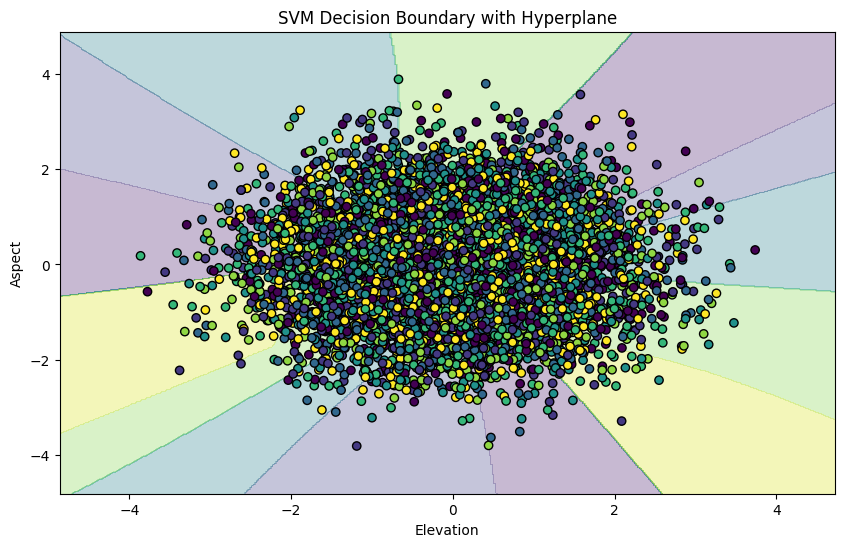


Classification Report:
              precision    recall  f1-score   support

           1       0.13      0.08      0.10       300
           2       0.12      0.06      0.08       277
           3       0.15      0.07      0.10       263
           4       0.14      0.08      0.10       291
           5       0.15      0.49      0.23       283
           6       0.13      0.18      0.15       299
           7       0.11      0.02      0.03       287

    accuracy                           0.14      2000
   macro avg       0.13      0.14      0.11      2000
weighted avg       0.13      0.14      0.12      2000



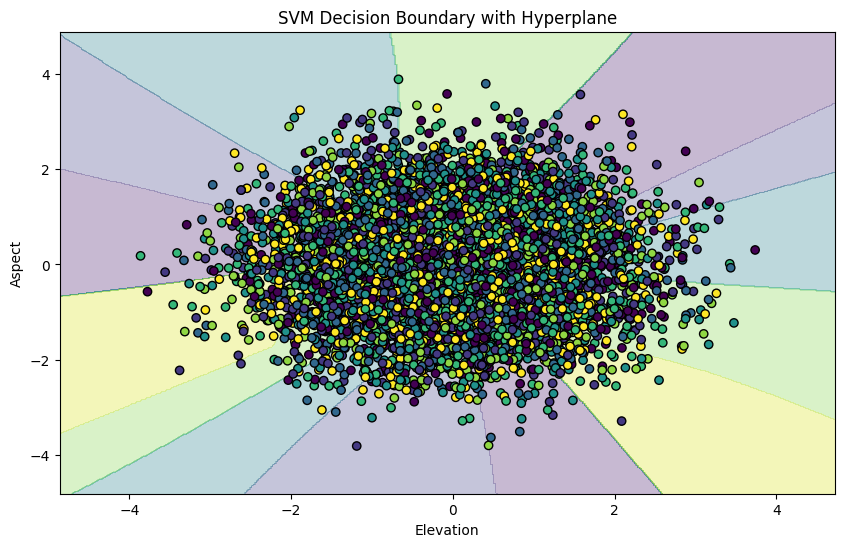

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer

# Load the dataset
data = pd.read_csv('/content/forest_type.csv')

# Assuming the last column is the target variable and the rest are features
X = data.iloc[:, :-1].values  # Features
y = data.iloc[:, -1].values   # Target

# Handle missing values by imputing with the mean
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply PCA to reduce the number of dimensions to 2 for visualization
pca_viz = PCA(n_components=2)
X_train_2d = pca_viz.fit_transform(X_train_scaled)
X_test_2d = pca_viz.transform(X_test_scaled)

# Define a parameter grid with a wider range of values
param_grid = {
    'C': [0.01, 0.1, 1, 10],
    'gamma': [0.01, 0.1, 'scale', 'auto'],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid']
}

# Create SVM classifier
svm = SVC(random_state=42)

# Perform GridSearchCV with parallel processing
grid_search = GridSearchCV(svm, param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train_2d, y_train)

# Get the best parameters and model
best_params = grid_search.best_params_
best_svm = grid_search.best_estimator_

print("Best parameters:", best_params)

# Make predictions on the test set
y_pred = best_svm.predict(X_test_2d)


# Plot the decision boundary for the best parameters
plot_decision_boundary(X_train_2d, y_train, best_svm)


# Print detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Visualization of SVM decision boundary
def plot_decision_boundary(X, y, model):
    # Create a grid to plot
    h = .02  # step size in the mesh
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    # Predict on the grid
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot the decision boundary
    plt.figure(figsize=(10, 6))
    plt.contourf(xx, yy, Z, alpha=0.3)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', marker='o')
    plt.xlabel('Elevation')
    plt.ylabel('Aspect')
    plt.title('SVM Decision Boundary with Hyperplane')
    plt.show()

# Plot the decision boundary
plot_decision_boundary(X_train_2d, y_train, best_svm)


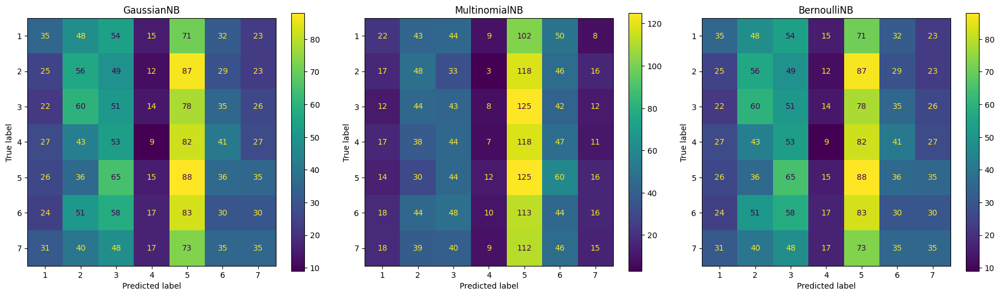

GaussianNB Accuracy: 0.15
MultinomialNB Accuracy (Best): 0.15
BernoulliNB Accuracy (Best): 0.15


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Assuming the file is uploaded and named 'forest_type.csv'
data = pd.read_csv('forest_type.csv')

X = data.drop('Cover_Type', axis=1)
y = data['Cover_Type']

# Scale features to range [0, 1] before feature selection
minmax_scaler = MinMaxScaler()
X_scaled = minmax_scaler.fit_transform(X)

k_best = SelectKBest(chi2, k=10)
X_new = k_best.fit_transform(X_scaled, y)

X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_mnb = minmax_scaler.fit_transform(X_train)
X_test_mnb = minmax_scaler.transform(X_test)

# Naive Bayes Classifiers
gnb = GaussianNB()
mnb = MultinomialNB()
bnb = BernoulliNB()

# Hyperparameter tuning for MultinomialNB and BernoulliNB using GridSearchCV
bnb_params = {'alpha': [0.1, 0.5, 1.0]}
mnb_params = {'alpha': [0.1, 0.5, 1.0]}

bnb_grid = GridSearchCV(BernoulliNB(), bnb_params, cv=5, scoring='accuracy')
mnb_grid = GridSearchCV(MultinomialNB(), mnb_params, cv=5, scoring='accuracy')

# Fit the models
gnb.fit(X_train_scaled, y_train)
mnb_grid.fit(X_train_mnb, y_train)
bnb_grid.fit(X_train, y_train)

# Best models after grid search
mnb_best = mnb_grid.best_estimator_
bnb_best = bnb_grid.best_estimator_

# Make predictions
y_pred_gnb = gnb.predict(X_test_scaled)
y_pred_mnb = mnb_best.predict(X_test_mnb)
y_pred_bnb = bnb_best.predict(X_test)

# Plot confusion matrices for each classifier
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# GaussianNB Confusion Matrix
ConfusionMatrixDisplay.from_estimator(gnb, X_test_scaled, y_test, ax=axs[0])
axs[0].set_title('GaussianNB')

# MultinomialNB Confusion Matrix
ConfusionMatrixDisplay.from_estimator(mnb_best, X_test_mnb, y_test, ax=axs[1])
axs[1].set_title('MultinomialNB')

# BernoulliNB Confusion Matrix
ConfusionMatrixDisplay.from_estimator(bnb_best, X_test, y_test, ax=axs[2])
axs[2].set_title('BernoulliNB')

plt.tight_layout()
plt.show()

# Print accuracies
print(f"GaussianNB Accuracy: {accuracy_score(y_test, y_pred_gnb):.2f}")
print(f"MultinomialNB Accuracy (Best): {accuracy_score(y_test, y_pred_mnb):.2f}")
print(f"BernoulliNB Accuracy (Best): {accuracy_score(y_test, y_pred_bnb):.2f}")


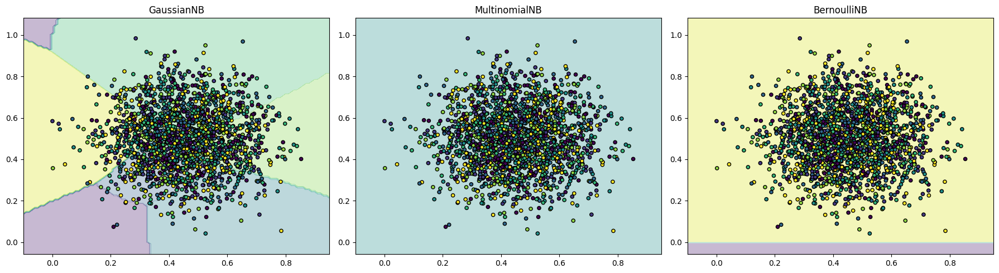

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Assuming the file is uploaded and named 'forest_type.csv'
data = pd.read_csv('forest_type.csv')

X = data.drop('Cover_Type', axis=1)
y = data['Cover_Type']

# Standardize the data first (MinMaxScaler ensures non-negative values)
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Reduce to 2 dimensions using PCA
pca = PCA(n_components=2)
pca
X_pca = pca.fit_transform(X_scaled)

# Apply MinMaxScaler again after PCA to ensure non-negative values for MultinomialNB and BernoulliNB
X_pca_scaled = MinMaxScaler().fit_transform(X_pca)

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X_pca_scaled, y, test_size=0.2, random_state=42, stratify=y)

# Naive Bayes Classifiers
gnb = GaussianNB()
mnb = MultinomialNB()
bnb = BernoulliNB()

# Fit the models
gnb.fit(X_train, y_train)
mnb.fit(X_train, y_train)
bnb.fit(X_train, y_train)

# Define a function to plot decision boundaries
def plot_decision_boundaries(X, y, classifier, ax, title):
    x_min, x_max = X[:, 0].min() - 0.1, X[:, 0].max() + 0.1
    y_min, y_max = X[:, 1].min() - 0.1, X[:, 1].max() + 0.1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))
    Z = classifier.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.3)
    scatter = ax.scatter(X[:, 0], X[:, 1], c=y, edgecolor='k', s=20, cmap='viridis')
    ax.set_title(title)
    return scatter

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# GaussianNB Decision Boundary
plot_decision_boundaries(X_test, y_test, gnb, axs[0], 'GaussianNB')

# MultinomialNB Decision Boundary
plot_decision_boundaries(X_test, y_test, mnb, axs[1], 'MultinomialNB')

# BernoulliNB Decision Boundary
plot_decision_boundaries(X_test, y_test, bnb, axs[2], 'BernoulliNB')

plt.tight_layout()
plt.show()


Explained variance ratio for each principal component:
[0.02116177 0.02087347 0.02082737 0.02060839 0.02059307 0.02034491
 0.02017188 0.02011426 0.02000436 0.01988473 0.01971745 0.01962052
 0.01957322 0.01952896 0.01947166 0.01936599 0.01931926 0.01917561
 0.0190753  0.01900427 0.01893142 0.01885814 0.01880388 0.0187402
 0.01871564 0.01867128 0.01861153 0.01851092 0.01842463 0.0183227
 0.01821254 0.01819463 0.01812186 0.01802937 0.01788464 0.01781853
 0.01777455 0.01767854 0.01758806 0.01755088 0.01745076 0.01727311
 0.01725918 0.01725063 0.01712601 0.01701296 0.01694852 0.01691859
 0.0168316  0.01666999 0.016557   0.01647942 0.01629654 0.01604535]

Cumulative variance for principal components:
[0.02116177 0.04203524 0.0628626  0.08347099 0.10406406 0.12440897
 0.14458084 0.1646951  0.18469946 0.20458418 0.22430163 0.24392215
 0.26349537 0.28302433 0.30249599 0.32186197 0.34118123 0.36035684
 0.37943215 0.39843642 0.41736784 0.43622598 0.45502986 0.47377006
 0.4924857  0.51115698 0.529

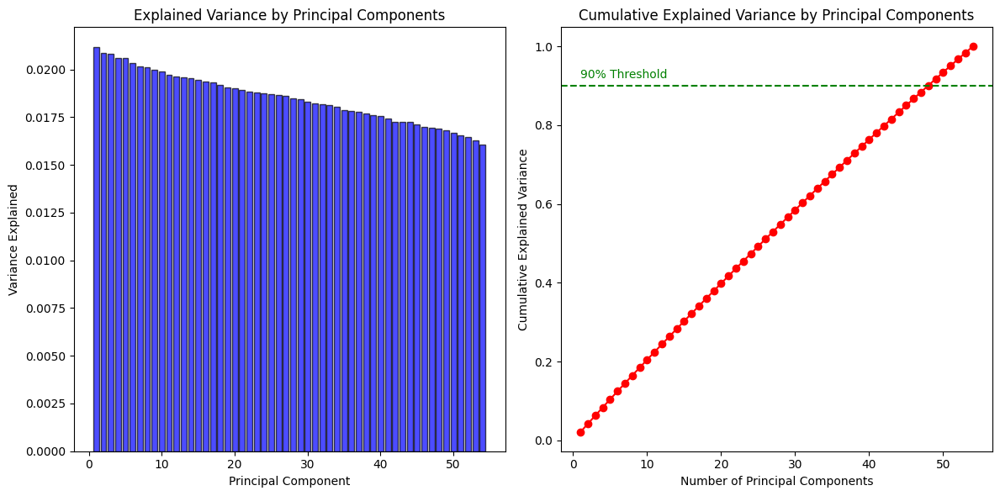

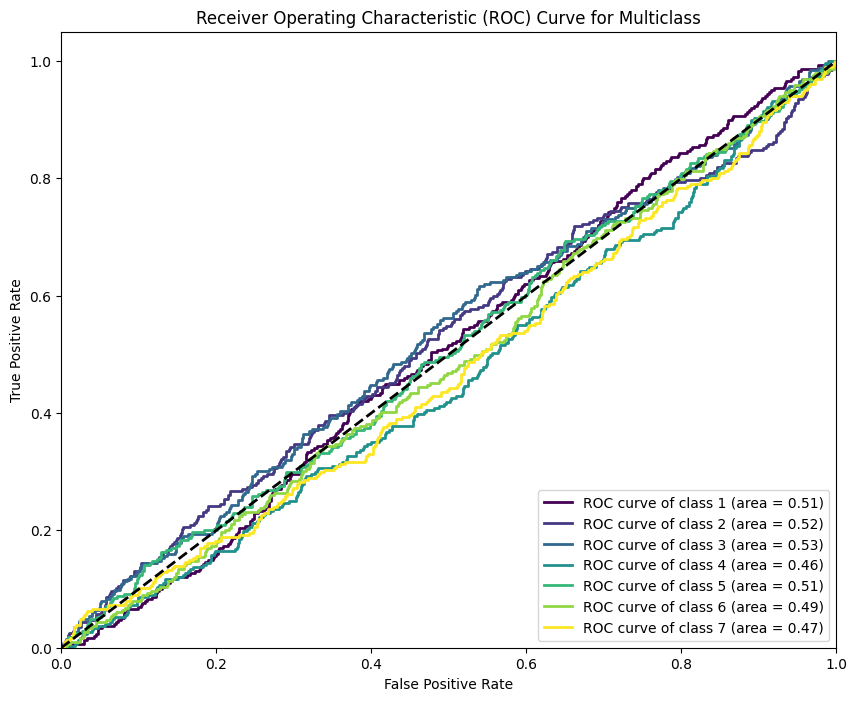

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
from sklearn.multiclass import OneVsRestClassifier
from sklearn.decomposition import PCA

# Load the dataset
file_path = '/content/forest_type.csv'
data = pd.read_csv(file_path)

# Separate features and target
X = data.drop('Cover_Type', axis=1)
y = data['Cover_Type']

# Binarize the output
classes = np.unique(y)
y_bin = label_binarize(y, classes=classes)

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA(n_components=0.9)
X_pca = pca.fit_transform(X_scaled)

# Print explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Print explained variance ratio and cumulative variance
print("Explained variance ratio for each principal component:")
print(explained_variance_ratio)

print("\nCumulative variance for principal components:")
print(cumulative_variance)

# Plot explained variance and cumulative variance
plt.figure(figsize=(12, 6))

# Explained Variance
plt.subplot(1, 2, 1)
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.7, color='blue', edgecolor='black')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('Explained Variance by Principal Components')

# Cumulative Variance
plt.subplot(1, 2, 2)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', color='red')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Principal Components')
plt.axhline(y=0.90, color='green', linestyle='--')  # Horizontal line at 90%
plt.text(x=1, y=0.92, s='90% Threshold', color='green')

plt.tight_layout()
plt.show()

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_bin, test_size=0.2, random_state=42)

# Initialize and train the One-vs-Rest Logistic Regression model
logistic_regressor = OneVsRestClassifier(LogisticRegression())
logistic_regressor.fit(X_train, y_train)

# Make predictions
y_score = logistic_regressor.decision_function(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
colors = plt.cm.viridis(np.linspace(0, 1, len(classes)))
for i, color in zip(range(len(classes)), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'ROC curve of class {classes[i]} (area = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc="lower right")
plt.show()


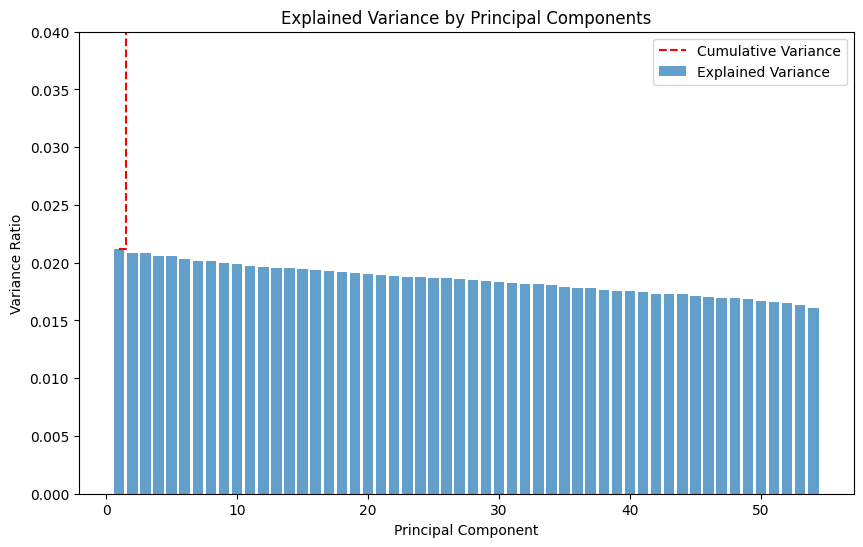

Number of components explaining 95% of variance: 51

Linear Regression Metrics: (4.104169021863482, 2.0258748781362295, 1.749850892304009, -0.009302034994823627)


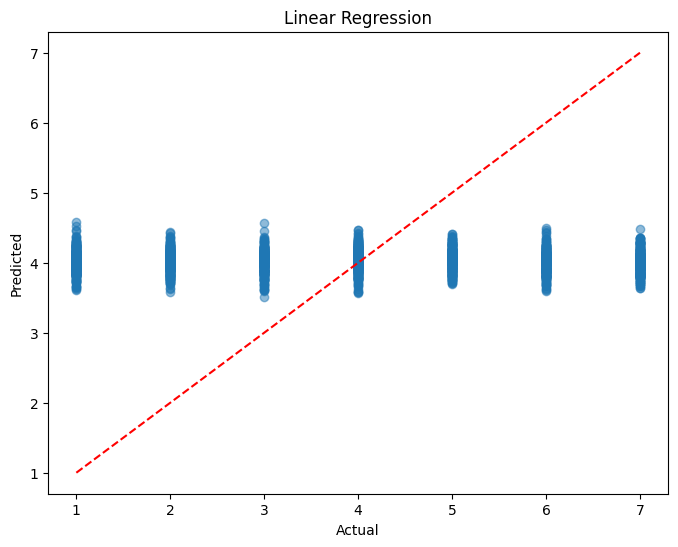

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/forest_type.csv'
data = pd.read_csv(file_path)

# Assuming 'Cover_Type' is the last column, adjust this based on your dataset
target_column = 'Cover_Type'

# Check if the target column exists, and adjust if necessary
if target_column not in data.columns:
    raise ValueError(f"Target column '{target_column}' not found. Please check the column names.")

# Separate features and target
X = data.drop(target_column, axis=1)
y = data[target_column]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Calculate explained variance ratio (PCA scores)
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Plot explained variance ratio with adjusted scale
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, label='Explained Variance')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', linestyle='--', color='red', label='Cumulative Variance')
plt.xlabel('Principal Component')
plt.ylabel('Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.legend()
plt.ylim(0, 0.04)
plt.show()

# Select the number of components that explain most of the variance (e.g., 95%)
n_components = np.argmax(cumulative_variance >= 0.95) + 1
print(f"Number of components explaining 95% of variance: {n_components}")

# Reduce dimensionality based on the selected number of components
pca = PCA(n_components=n_components)
X_reduced = pca.fit_transform(X_scaled)

scaler_after_pca = MinMaxScaler()
X_reduced_scaled = scaler_after_pca.fit_transform(X_reduced)

# Split the reduced and scaled data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_reduced_scaled, y, test_size=0.2, random_state=42)

# Initialize and train the Linear Regression model
linear_regressor = LinearRegression()
linear_regressor.fit(X_train, y_train)
y_pred_linear = linear_regressor.predict(X_test)

# Calculate evaluation metrics
def calculate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mae, r2

# Calculate metrics for the model
metrics_linear = calculate_metrics(y_test, y_pred_linear)

print("\nLinear Regression Metrics:", metrics_linear)

# Plot the actual vs predicted values for Linear Regression
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_linear, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Linear Regression')
plt.show()


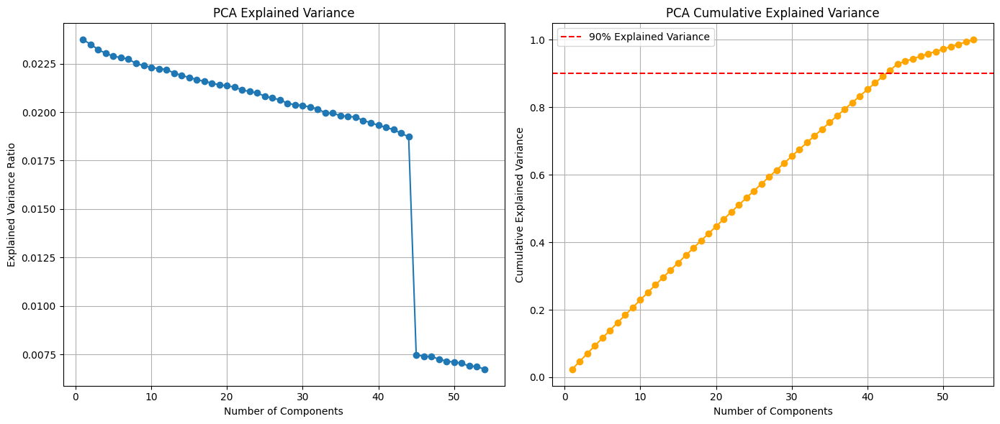

Number of components explaining 90% variance: 43


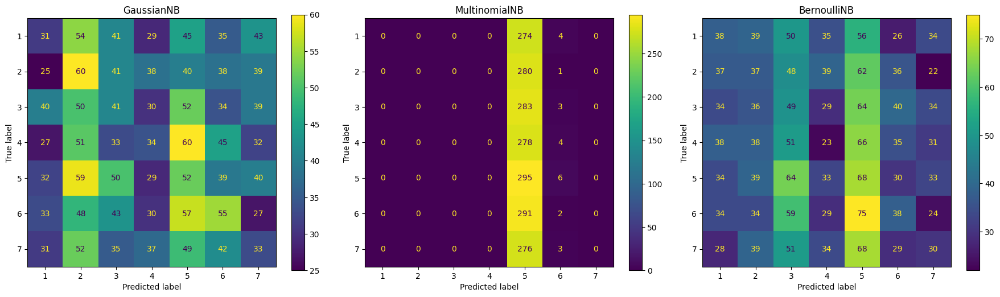

GaussianNB Accuracy: 0.15
MultinomialNB Accuracy (Best): 0.15
BernoulliNB Accuracy (Best): 0.14


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Assuming the file is uploaded and named 'forest_type.csv'
data = pd.read_csv('forest_type.csv')

X = data.drop('Cover_Type', axis=1)
y = data['Cover_Type']

# Scale features to range [0, 1] before PCA
minmax_scaler = MinMaxScaler()
X_scaled = minmax_scaler.fit_transform(X)

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Plot the explained variance ratio and cumulative variance
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Explained variance ratio
axs[0].plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
axs[0].set_xlabel('Number of Components')
axs[0].set_ylabel('Explained Variance Ratio')
axs[0].set_title('PCA Explained Variance')
axs[0].grid(True)

# Cumulative variance
cumulative_variance = pca.explained_variance_ratio_.cumsum()
axs[1].plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', color='orange')
axs[1].set_xlabel('Number of Components')
axs[1].set_ylabel('Cumulative Explained Variance')
axs[1].set_title('PCA Cumulative Explained Variance')
axs[1].axhline(y=0.9, color='r', linestyle='--', label='90% Explained Variance')
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
plt.show()

# Choose the number of components that explain at least 90% of the variance
num_components = next(i for i, total_variance in enumerate(cumulative_variance) if total_variance >= 0.9) + 1
print(f"Number of components explaining 90% variance: {num_components}")

# Apply PCA with the chosen number of components
pca = PCA(n_components=num_components)
X_pca = pca.fit_transform(X_scaled)

X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42, stratify=y)

# Scale the train and test sets for GaussianNB
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Scale the train and test sets for MultinomialNB and BernoulliNB
X_train_mnb = minmax_scaler.fit_transform(X_train)
X_test_mnb = minmax_scaler.transform(X_test)

# Naive Bayes Classifiers
gnb = GaussianNB()
mnb = MultinomialNB()
bnb = BernoulliNB()

# Hyperparameter tuning for MultinomialNB and BernoulliNB using GridSearchCV
bnb_params = {'alpha': [0.1, 0.5, 1.0]}
mnb_params = {'alpha': [0.1, 0.5, 1.0]}

bnb_grid = GridSearchCV(BernoulliNB(), bnb_params, cv=5, scoring='accuracy')
mnb_grid = GridSearchCV(MultinomialNB(), mnb_params, cv=5, scoring='accuracy')

# Fit the models
gnb.fit(X_train_scaled, y_train)
mnb_grid.fit(X_train_mnb, y_train)
bnb_grid.fit(X_train, y_train)

# Best models after grid search
mnb_best = mnb_grid.best_estimator_
bnb_best = bnb_grid.best_estimator_

# Make predictions
y_pred_gnb = gnb.predict(X_test_scaled)
y_pred_mnb = mnb_best.predict(X_test_mnb)
y_pred_bnb = bnb_best.predict(X_test)

# Plot confusion matrices for each classifier
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# GaussianNB Confusion Matrix
ConfusionMatrixDisplay.from_estimator(gnb, X_test_scaled, y_test, ax=axs[0])
axs[0].set_title('GaussianNB')

# MultinomialNB Confusion Matrix
ConfusionMatrixDisplay.from_estimator(mnb_best, X_test_mnb, y_test, ax=axs[1])
axs[1].set_title('MultinomialNB')

# BernoulliNB Confusion Matrix
ConfusionMatrixDisplay.from_estimator(bnb_best, X_test, y_test, ax=axs[2])
axs[2].set_title('BernoulliNB')

plt.tight_layout()
plt.show()

# Print accuracies
print(f"GaussianNB Accuracy: {accuracy_score(y_test, y_pred_gnb):.2f}")
print(f"MultinomialNB Accuracy (Best): {accuracy_score(y_test, y_pred_mnb):.2f}")
print(f"BernoulliNB Accuracy (Best): {accuracy_score(y_test, y_pred_bnb):.2f}")


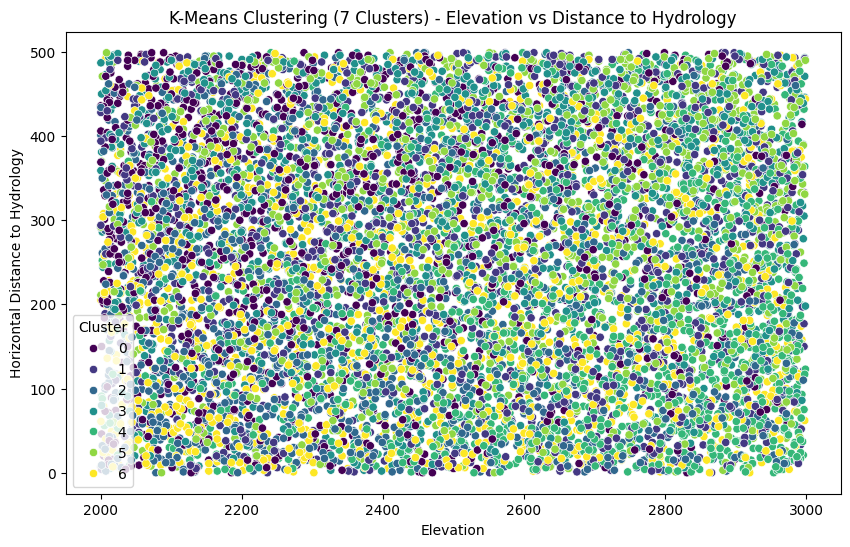

In [ ]:
# Importing necessary libraries
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('/content/forest_type.csv')

# Function to apply K-Means and plot the results
# Separate features and target
X = df.drop(columns=['Cover_Type'])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-means clustering
kmeans = KMeans(n_clusters=7, random_state=42)
df['Cluster'] = kmeans.fit_predict(X_scaled)

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Elevation'], y=df['Horizontal_Distance_To_Hydrology'], hue=df['Cluster'], palette='viridis')
plt.title("K-Means Clustering (7 Clusters) - Elevation vs Distance to Hydrology")
plt.xlabel("Elevation")
plt.ylabel("Horizontal Distance to Hydrology")
plt.show()


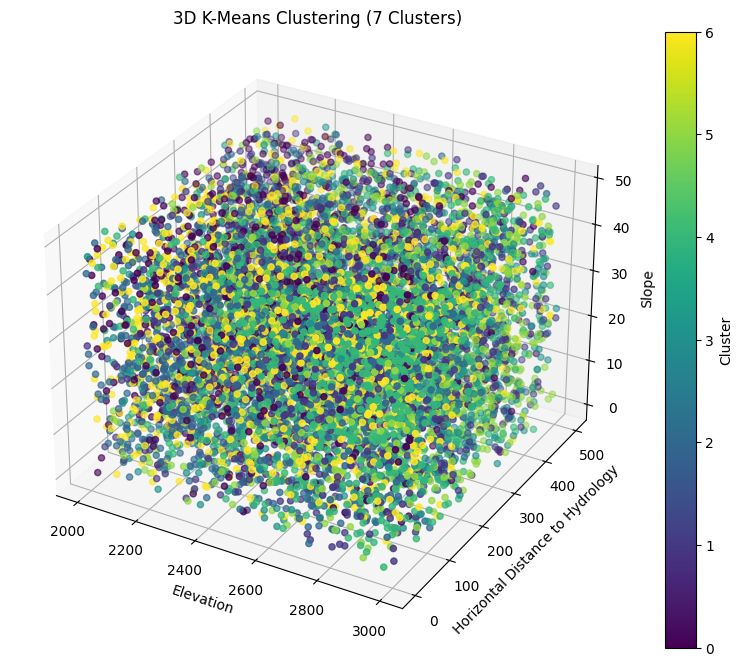

In [ ]:
# Importing necessary libraries
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/forest_type.csv')

# Separate features and target
X = df.drop(columns=['Cover_Type'])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-means clustering
kmeans = KMeans(n_clusters=7, random_state=42)
df['Cluster'] = kmeans.fit_predict(X_scaled)

# 3D Plotting using Elevation, Horizontal_Distance_To_Hydrology, and Slope
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
scatter = ax.scatter(df['Elevation'], df['Horizontal_Distance_To_Hydrology'], df['Slope'],
                     c=df['Cluster'], cmap='viridis')

# Adding labels and title
ax.set_xlabel('Elevation')
ax.set_ylabel('Horizontal Distance to Hydrology')
ax.set_zlabel('Slope')
ax.set_title("3D K-Means Clustering (7 Clusters)")

# Adding a color bar to represent clusters
legend = fig.colorbar(scatter)
legend.set_label("Cluster")

plt.show()


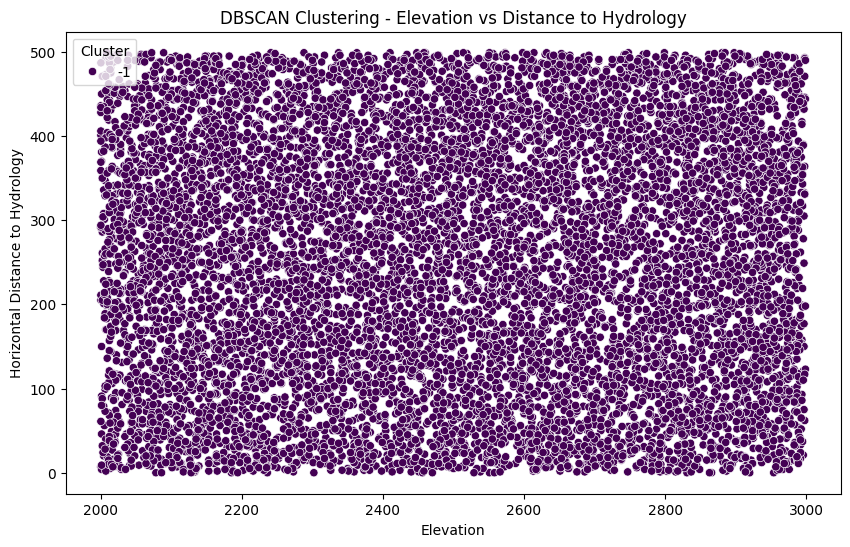

In [ ]:
# Importing necessary libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('/content/forest_type.csv')

X = df.drop(columns=['Cover_Type'])

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

dbscan = DBSCAN(eps=0.5, min_samples=5)
df['Cluster'] = dbscan.fit_predict(X_scaled)


plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Elevation'], y=df['Horizontal_Distance_To_Hydrology'], hue=df['Cluster'], palette='viridis')
plt.title("DBSCAN Clustering - Elevation vs Distance to Hydrology")
plt.xlabel("Elevation")
plt.ylabel("Horizontal Distance to Hydrology")
plt.show()


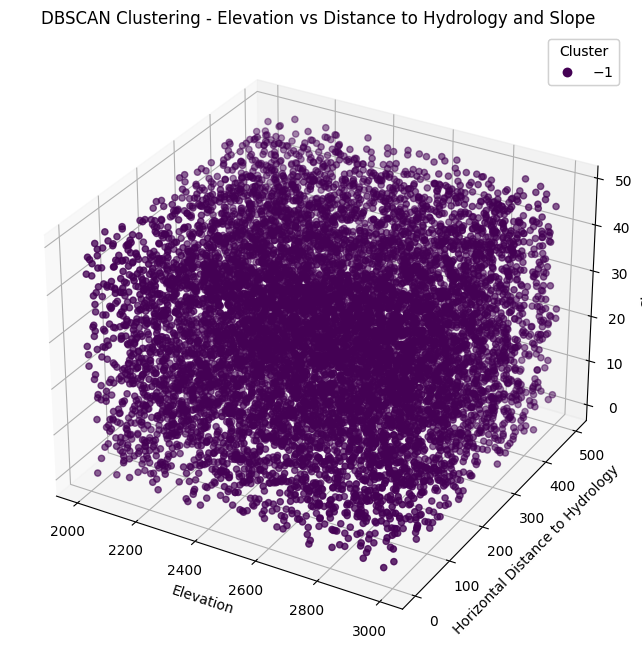

In [ ]:
# Importing necessary libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Load the dataset
df = pd.read_csv('/content/forest_type.csv')

# Separate features and target (assuming the target column is 'Cover_Type')
X = df.drop(columns=['Cover_Type'])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
df['Cluster'] = dbscan.fit_predict(X_scaled)

# Plot the DBSCAN clusters in 3D (Elevation vs Horizontal Distance to Hydrology and Slope)
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Assigning x, y, and z for the 3D plot (z is now Slope)
x = df['Elevation']
y = df['Horizontal_Distance_To_Hydrology']
z = df['Slope']  # Using Slope instead of Vertical Distance to Hydrology
clusters = df['Cluster']

# Create 3D scatter plot
scatter = ax.scatter(x, y, z, c=clusters, cmap='viridis')

# Adding plot labels
ax.set_title("DBSCAN Clustering - Elevation vs Distance to Hydrology and Slope")
ax.set_xlabel("Elevation")
ax.set_ylabel("Horizontal Distance to Hydrology")
ax.set_zlabel("Slope")

# Adding color bar for clusters
legend1 = ax.legend(*scatter.legend_elements(), title="Cluster")
ax.add_artist(legend1)

plt.show()


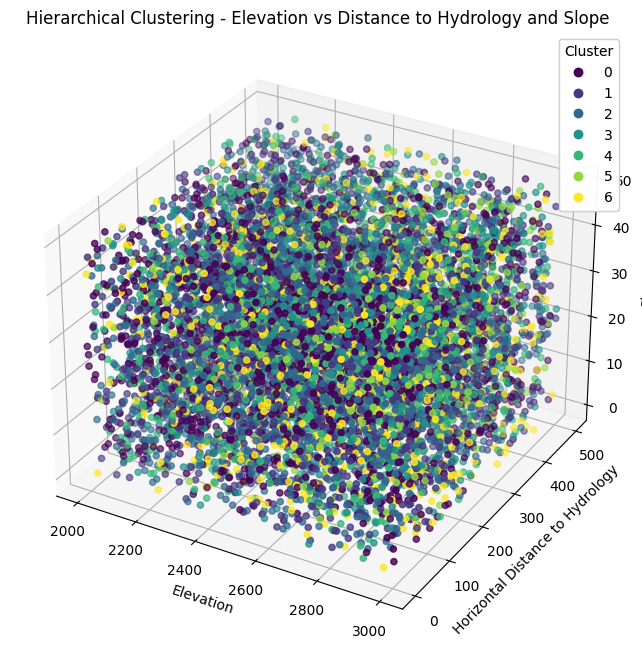

In [ ]:
# Importing necessary libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Load the dataset
df = pd.read_csv('/content/forest_type.csv')

# Separate features and target (assuming the target column is 'Cover_Type')
X = df.drop(columns=['Cover_Type'])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=7)  # Adjust the number of clusters
df['Cluster'] = agglo.fit_predict(X_scaled)

# Plot the clusters in 3D (Elevation vs Horizontal Distance to Hydrology and Slope)
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Assigning x, y, and z for the 3D plot
x = df['Elevation']
y = df['Horizontal_Distance_To_Hydrology']
z = df['Slope']  # Using Slope instead of Vertical Distance to Hydrology
clusters = df['Cluster']

# Create 3D scatter plot
scatter = ax.scatter(x, y, z, c=clusters, cmap='viridis')

# Adding plot labels
ax.set_title("Hierarchical Clustering - Elevation vs Distance to Hydrology and Slope")
ax.set_xlabel("Elevation")
ax.set_ylabel("Horizontal Distance to Hydrology")
ax.set_zlabel("Slope")

# Adding color bar for clusters
legend1 = ax.legend(*scatter.legend_elements(), title="Cluster")
ax.add_artist(legend1)

plt.show()


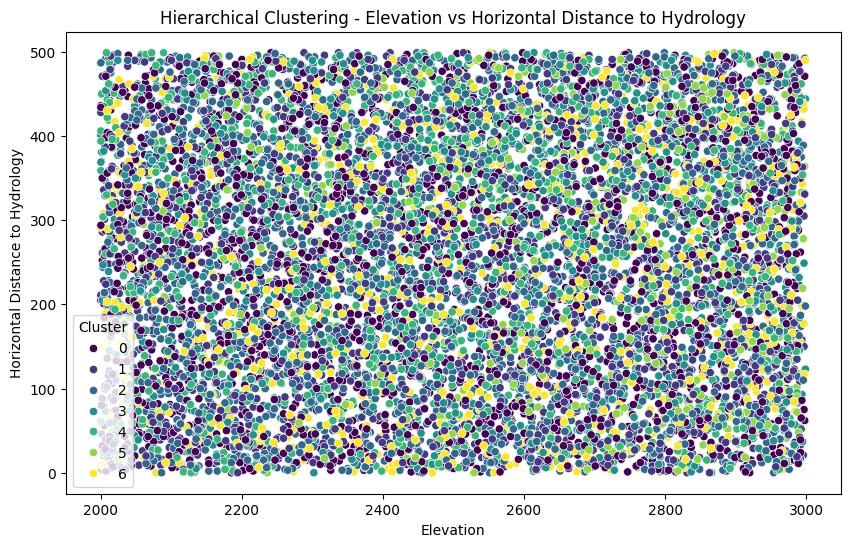

In [ ]:
# Importing necessary libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv('/content/forest_type.csv')

# Separate features and target (assuming the target column is 'Cover_Type')
X = df.drop(columns=['Cover_Type'])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=7)
df['Cluster'] = agglo.fit_predict(X_scaled)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Elevation'], y=df['Horizontal_Distance_To_Hydrology'], hue=df['Cluster'], palette='viridis')
plt.title("Hierarchical Clustering - Elevation vs Horizontal Distance to Hydrology")
plt.xlabel("Elevation")
plt.ylabel("Horizontal Distance to Hydrology")
plt.legend(title='Cluster')
plt.show()


Categorical columns: Index(['Wilderness_Area', 'Soil_Type'], dtype='object')
Confusion Matrix:
 [[0 0 0 0 0 0 0]
 [1 1 0 0 1 1 1]
 [0 1 0 0 1 1 0]
 [0 0 0 0 0 0 0]
 [0 0 2 1 0 1 0]
 [1 1 1 0 0 0 0]
 [0 1 1 0 0 3 0]]


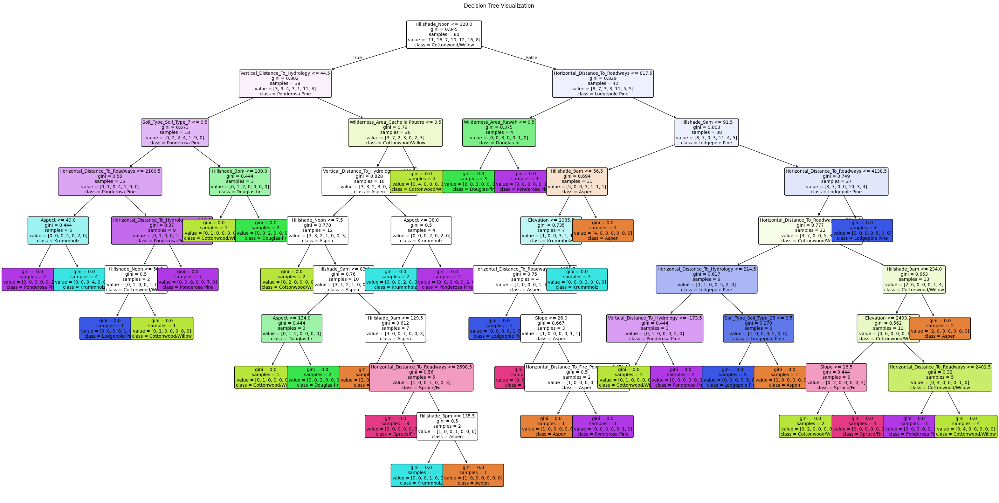

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
from sklearn import tree

# Load the dataset (replace with your dataset path)
file_path = '/content/forest_cover_type_dataset.csv'  # Path to your CSV file
data = pd.read_csv(file_path)

# Separate features and target
X = data.drop('Cover_Type', axis=1)  # Replace 'Cover_Type' with your target column
y = data['Cover_Type']

# Check for non-numeric columns and apply one-hot encoding
categorical_columns = X.select_dtypes(include=['object']).columns
if len(categorical_columns) > 0:
    print("Categorical columns:", categorical_columns)
    X = pd.get_dummies(X, columns=categorical_columns)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Decision Tree model
dt_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)

# Train the Decision Tree model
dt_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = dt_classifier.predict(X_test)

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)


# Save the decision tree as a high-resolution image
fig, ax = plt.subplots(figsize=(40, 20))  # Increase size for clarity
tree.plot_tree(dt_classifier,
               filled=True,
               feature_names=X.columns,
               class_names=[str(i) for i in dt_classifier.classes_],
               rounded=True,
               fontsize=10)
plt.title("Decision Tree Visualization")
plt.savefig("decision_tree_high_res.png", dpi=300, bbox_inches='tight')  # Save as a high-resolution PNG
plt.show()


Categorical columns: Index(['Wilderness_Area', 'Soil_Type'], dtype='object')
Accuracy: 0.15
Confusion Matrix:
 [[0 0 0 0 0 0 0]
 [1 1 0 0 2 1 0]
 [0 2 0 0 1 0 0]
 [0 0 0 0 0 0 0]
 [1 1 0 1 1 0 0]
 [0 0 1 0 1 1 0]
 [0 2 0 0 1 2 0]]
Classification Report:
                    precision    recall  f1-score   support

            Aspen       0.00      0.00      0.00         0
Cottonwood/Willow       0.17      0.20      0.18         5
      Douglas-fir       0.00      0.00      0.00         3
        Krummholz       0.00      0.00      0.00         0
   Lodgepole Pine       0.17      0.25      0.20         4
   Ponderosa Pine       0.25      0.33      0.29         3
       Spruce/Fir       0.00      0.00      0.00         5

         accuracy                           0.15        20
        macro avg       0.08      0.11      0.10        20
     weighted avg       0.11      0.15      0.13        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

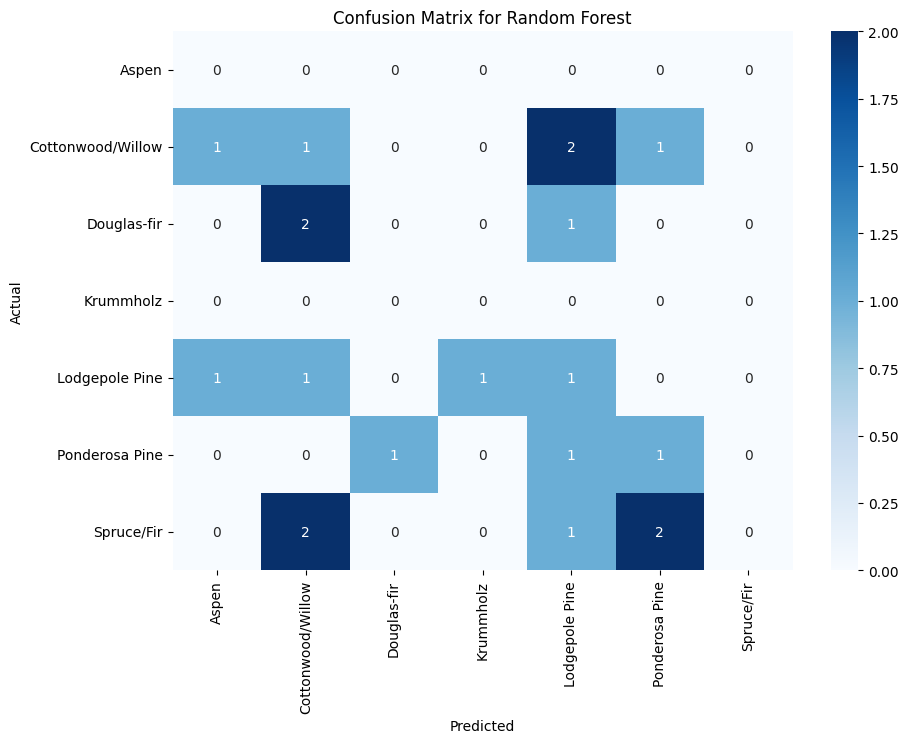

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset (replace with your dataset path)
file_path = '/content/forest_cover_type_dataset.csv'  # Path to your CSV file
data = pd.read_csv(file_path)

# Separate features and target
X = data.drop('Cover_Type', axis=1)  # Replace 'Cover_Type' with your target column
y = data['Cover_Type']

# Check for non-numeric columns and apply one-hot encoding
categorical_columns = X.select_dtypes(include=['object']).columns
if len(categorical_columns) > 0:
    print("Categorical columns:", categorical_columns)
    X = pd.get_dummies(X, columns=categorical_columns)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest model
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the Random Forest model
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)

# Classification report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Plot the confusion matrix for better visualization
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=rf_classifier.classes_, yticklabels=rf_classifier.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title("Confusion Matrix for Random Forest")
plt.show()

# Feature importance plot
feature_importances = rf_classifier.feature_importances_
features = X.columns

# Sort features by importance
indices = feature_importances.argsort()[::-1]
sorted_features = features[indices]
sorted_importances = feature_importances[indices]

plt.show()


Categorical columns: Index(['Wilderness_Area', 'Soil_Type'], dtype='object')


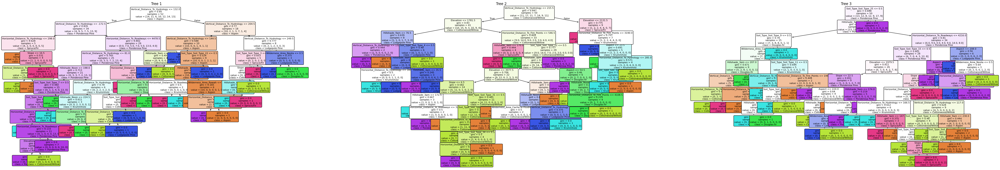

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Load the dataset (replace with your dataset path)
file_path = '/content/forest_cover_type_dataset.csv'  # Path to your CSV file
data = pd.read_csv(file_path)

# Separate features and target
X = data.drop('Cover_Type', axis=1)  # Replace 'Cover_Type' with your target column
y = data['Cover_Type']

# Check for non-numeric columns and apply one-hot encoding
categorical_columns = X.select_dtypes(include=['object']).columns
if len(categorical_columns) > 0:
    print("Categorical columns:", categorical_columns)
    X = pd.get_dummies(X, columns=categorical_columns)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest model
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

num_trees_to_visualize = 3
fig, axes = plt.subplots(nrows=1, ncols=num_trees_to_visualize, figsize=(20 * num_trees_to_visualize, 10))

for i in range(num_trees_to_visualize):
    single_tree = rf_classifier.estimators_[i]  # Select the i-th tree from the forest
    plot_tree(single_tree,
              filled=True,
              feature_names=X.columns,
              class_names=[str(i) for i in rf_classifier.classes_],
              rounded=True,
              fontsize=8,
              ax=axes[i])
    axes[i].set_title(f"Tree {i+1}")

plt.show()


# New Section